<img src="images/bannerlandbouw.png" alt="Banner" width="400"/>

<div>
    <font color=#690027 markdown="1">
<h1>CREATE YOUR OWN DATASET</h1>    </font>
</div>

<div class="alert alert-block alert-success">
With the current YOLO-algorithm, many things can already be recognized. However, because only a few objects are chosen from each category, not all objects are recognized. Writing an algorithm requires a huge memory space for the immense dataset. This notebook shows how you can create your own dataset to train your own algorithm.</div>

To train an algorithm, you need a lot of photos. With three hundred photos the algorithm will already work well, but the more photos, the more accurate the algorithm will work. You will train an algorithm to recognize tomatoes. As a first step, you manually indicate all the tomatoes in the photos using software. This algorithm has been trained with a self-created dataset of tomatoes and can therefore already recognize tomatoes.
To use your own dataset as training data, you first need to assign a label to each photo. So you always enter a photo and say what is in the photo, in this case a tomato. The computer will then make connections between the objects in the photo and the word 'tomato' and can then start recognizing tomatoes itself. To assign a label to the photos, follow the instructions you find in the included Word document.

<div>
    <font color=#690027 markdown="1">
<h2>1. Copying Github [1]</h2>    </font>
</div>

To train the algorithm, a number of Python files will be used. These are all on a GitHub (a kind of Google drive) and you will copy them to our server. This can be done using the following code:

In [2]:
%cd TrainYourOwnYOLO

/home/jovyan/TrainYourOwnYOLO


In [1]:
to_run = True

In [2]:
if to_run:!git clone https://github.com/AntonMu/TrainYourOwnYOLO%cd TrainYourOwnYOLO!pip install -r requirements.txt    to_run = False!wandb login

Cloning into 'EigenDatasetYOLO'...
remote: Enumerating objects: 68, done.
remote: Counting objects: 100% (68/68), done.
remote: Compressing objects: 100% (61/61), done.
remote: Total 68 (delta 6), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (68/68), done.
/home/jovyan/TrainYourOwnYOLO
Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.
Traceback (most recent call last):
  File "/opt/conda/bin/wandb", line 5, in <module>
    from wandb.cli.cli import cli
  File "/opt/conda/lib/python3.7/site-packages/wandb/__init__.py", line 32, in <module>
    from wandb import sdk as wandb_sdk
  File "/opt/conda/lib/python3.7/site-packages/wandb/sdk/__init__.py", line 12, in <module>
    from .wandb_init import _attach, init  # noqa: F401
  File "/opt/conda/lib/python3.7/site-packages/wandb/sdk/wandb_init.py", line 36, in <module>
    from .backend.backend 

In [5]:
!pip install -r requirements.txt

Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.
ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'requirements.txt'


<div>
    <font color=#690027 markdown="1">
<h2>2. Train</h2>    </font>
</div>

Then you train the algorithm based on the dataset:

In [1]:
%cd 2_Training
!python Download_and_Convert_YOLO_weights.py

/home/jovyan/TrainYourOwnYOLO/2_Training


/ |#                                                  | 0 Elapsed Time: 0:00:00Downloaded Raw yolov3.weights in 1.1 seconds

2022-02-21 12:27:54.283818: W tensorflow/stream_executor/platform/default/dso_loader.cc:59] Could not load dynamic library 'libcudart.so.10.1'; dlerror: libcudart.so.10.1: cannot open shared object file: No such file or directory
2022-02-21 12:27:54.283863: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
Loading weights.
Weights Header:  1329865020 1348031555 1952981061 [1010723949]
Parsing Darknet config.
Creating Keras model.
Parsing section net_0
Parsing section convolutional_0
conv2d bn leaky (3, 3, 3, 32)
Traceback (most recent call last):
  File "convert.py", line 286, in <module>
    _main(parser.parse_args())
  File "convert.py", line 160, in _main
    buffer=weights_file.read(weights_size * 4),
TypeError: buffer is too small for re

Executing the code cell below will certainly take about twenty minutes, depending on the number of training photos you have added. If you haven't added a new dataset, skip this code cell.

In [ ]:
!python Train_YOLO.py

<div>
    <font color=#690027 markdown="1">
<h2>3. Test</h2>    </font>
</div>

Now that the algorithm is trained to recognize tomatoes, you can test it with a test image. Use the image `tomaat.jpg`, found in the `images` folder. The tomatoes will be framed and a decimal number (percentage) will be given indicating how certain the algorithm is.

[Errno 2] No such file or directory: 'TrainYourOwnYOLO'
/home/jovyan/TrainYourOwnYOLO
/home/jovyan/TrainYourOwnYOLO/3_Inference
/home/jovyan/TrainYourOwnYOLO/Data/Model_Weights/trained_weights_final.h5 model, anchors, and classes loaded in 15.09sec.
../tomaat.jpg
../tomaat.jpg
(416, 416, 3)
Found 1 boxes for img
tomaat 0.95 (1279, 1250) (2275, 2339)
Time spent: 4.516sec
tomaat_tomaat.jpg
../Data/Source_Images/Test_Image_Detection_Results/tomaat_tomaat.jpg


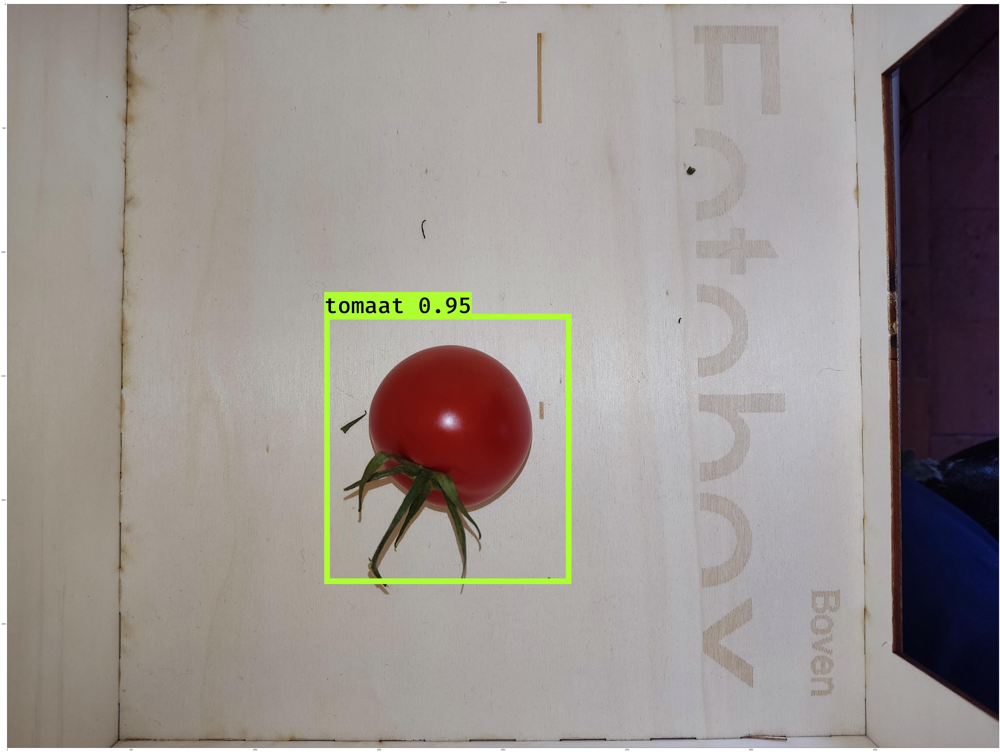

In [1]:
import argparse
%cd TrainYourOwnYOLO%cd 3_Inference/%run -i Detector.py --image "../images/tomato.jpg"

<div>
    <font color=#690027 markdown="1">
<h2>4. With camera</h2>    </font>
</div>

Now that the algorithm is working well, you can apply it to images you get from the webcam:

In [8]:
from IPython.display import HTML
The assistant hasn't provided any output because there's no Dutch text provided to be translated into English.<video id="video" width="320" height="240" autoplay></video>
<button id="snap">Take a photo</button><canvas id="canvas" width="320" height="240"></canvas>

<script>
// Grab elements, create settings, etc.var video = document.getElementById('video');
// Get access to the camera!if(navigator.mediaDevices && navigator.mediaDevices.getUserMedia) {    // Not adding `{ audio: true }` since we only want video nownavigator.mediaDevices.getUserMedia({ video: true }).then(function(stream) {//video.src = window.URL.createObjectURL(stream);        //video.play();        video.srcObject=stream;        video.play();    });
Without any Dutch text, it's impossible to provide a translation. Could you please provide the desired text?
// Elements for taking the snapshotvar canvas = document.getElementById("canvas");var context = canvas.getContext("2d");var video = document.getElementById("video");
// Trigger photo takedocument.getElementById("snap").addEventListener("click", function() {	context.drawImage(video, 0, 0, 320, 240);var myCanvas = document.getElementById("canvas");var image = myCanvas.toDataURL("image/png");IPython.notebook.kernel.execute("print('testing')")IPython.notebook.kernel.execute("image = '" + image + "'")You haven't provided any text to translate. Please provide Dutch text for translation.</script>

"""
It appears you forgot to provide the Dutch text that needs to be translated. Please provide the Dutch text so I can assist you further.

In [9]:
from PIL import Imageimport base64import ioimport numpy as np
pil_im = Image.open(io.BytesIO(base64.b64decode(image.split(',')[1])))im3 = np.array(pil_im)im3 = im3[:,:,0:3]im = Image.fromarray(im3)print(im)im.save("your_file.jpg")

<PIL.Image.Image image mode=RGB size=320x240 at 0x7F40B06B3650>


/home/jovyan/TrainYourOwnYOLO/Data/Model_Weights/trained_weights_final.h5 model, anchors, and classes loaded in 10.30sec.
your_file.jpg
(416, 416, 3)
Found 2 boxes for img
Tomaat 0.39 (175, 189) (273, 238)
Tomaat 0.99 (24, 45) (160, 191)
Time spent: 2.632sec
../Data/Source_Images/Test_Image_Detection_Results/your_file_catface.jpg


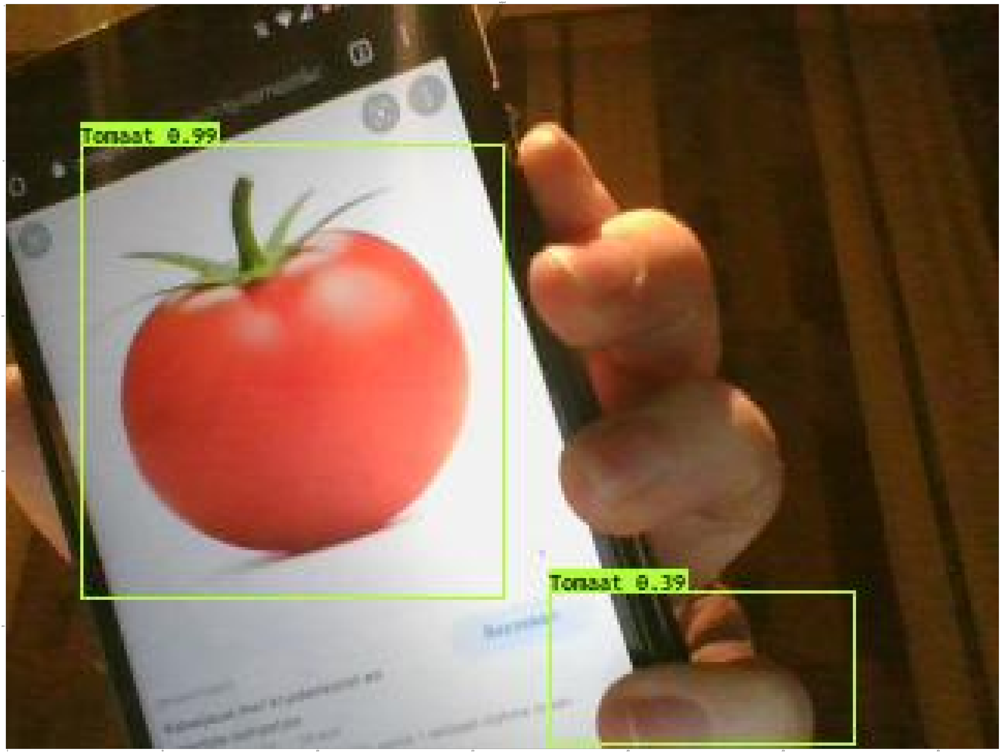

In [10]:
%run -i detector.py --image "your_file.jpg"

### References
[1] Muehlemann, A. (2019). TrainYourOwnYOLO: Building a Custom Object Detector from Scratch. GitHub. Accessed on January 24, 2022, from https://github.com/AntonMu/TrainYourOwnYOLO

<img src="images/cclic.png" alt="Banner" align="left" width="100"/><br><br>
AI in Agriculture notebook, see <a href="http://www.aiopschool.be">AI At School</a>, by M. Benoit, F. Wyffels & N. Gesquière is licensed under a <a href="http://creativecommons.org/licenses/by-nc-sa/4.0/">Creative Commons Attribution-NonCommercial-ShareAlike 4.0 International License</a>.